
## Goal
In this project you will create a data pipeline that ingests wather warnings
 
Input:
https://alerts.weather.gov/cap/us.php?x=0
fips6 location codes to translate warining location into region, state and county
 
Create a bronze delta table to where every batch of data is appended
Create a silver delta table where waning data is merge
Create a gold delta table where warning location is enriched

The pipeline should both consider initial and incremental loads
 
Create some visuals (charts) to analyse the data :
Some examples:
- Counts by state, county, date, type of alert
- What alerts are currently active

### Dataflows
get alerts, get fips -> select and filters alerts -> marge datasets geocode

## Leitura dos dados em Weather Alerts

In [0]:
import requests
import datetime, time

url = "https://alerts.weather.gov/cap/us.php?x=0"
alerts_path="/FileStore/tables/weather"

# Fetch 
response = requests.get(url)
xml_data = response.content


def weather_alerts(url_to_download,path_to_write):
    
    data_xml = requests.get(url_to_download).content

    filename_to_write='weather_alerts-{date:%Y-%m-%d_%H:%M:%S}.txt'.format( date=datetime.datetime.now() )
    path_to_write=path_to_write+"/"+filename_to_write

    alerts_file = dbutils.fs.put(path_to_write, str(data_xml))

    return alerts_file

alerts_file = weather_alerts(url, alerts_path)


Wrote 2077729 bytes.


### XML para Dataframe Spark

In [0]:
from pyspark.sql.functions import *
from pyspark.sql.types import *

df_alerts = spark.read.option("rowTag", "entry").format("xml").load(alerts_path)


In [0]:
display(df_alerts)

_VALUE,author,cap:areaDesc,cap:category,cap:certainty,cap:effective,cap:event,cap:expires,cap:geocode,cap:msgType,cap:onset,cap:parameter,cap:polygon,cap:sent,cap:severity,cap:status,cap:urgency,id,link,published,summary,title,updated
"List(\n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n)","List(List(\n, \n), NWS)","Allegan, MI",Met,Observed,2024-07-08T20:22:00Z,Severe Thunderstorm Warning,2024-07-08T20:45:00Z,"List(List(List(\n, \n, \n), 026005, SAME), List(List(\n, \n, \n), MIC005, UGC))",Update,2024-07-08T20:22:00Z,"List(List(List(\n, \n, \n), SVSGRR, AWIPSidentifier), List(List(\n, \n, \n), WWUS53 KGRR 082022, WMOidentifier), List(List(\n, \n, \n), A SEVERE THUNDERSTORM WARNING REMAINS IN EFFECT UNTIL 445 PM EDT FOR EASTERN ALLEGAN COUNTY, NWSheadline), List(List(\n, \n, \n), 2024-07-08T20:21:00-00:00...storm...216DEG...24KT...42.54,-85.85, eventMotionDescription), List(List(\n, \n, \n), RADAR INDICATED, windThreat), List(List(\n, \n, \n), 60 MPH, maxWindGust), List(List(\n, \n, \n), RADAR INDICATED, hailThreat), List(List(\n, \n, \n), 0.75, maxHailSize), List(List(\n, \n, \n), EAS, BLOCKCHANNEL), List(List(\n, \n, \n), NWEM, BLOCKCHANNEL), List(List(\n, \n, \n), CMAS, BLOCKCHANNEL), List(List(\n, \n, \n), WXR, EAS-ORG), List(List(\n, \n, \n), /O.CON.KGRR.SV.W.0064.000000T0000Z-240708T2045Z/, VTEC), List(List(\n, \n, \n), 2024-07-08T20:45:00+00:00, eventEndingTime))","42.62,-85.61 42.45,-85.8199999 42.52,-85.9599999 42.75,-85.79 42.62,-85.61",2024-07-08T20:22:00Z,Severe,Actual,Immediate,https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.b9b24c6a5bf4fbc95cc903f9990ce6072b068214.001.1,"List(https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.b9b24c6a5bf4fbc95cc903f9990ce6072b068214.001.1.cap, alternate)",2024-07-08T20:22:00Z,"At 421 PM EDT, a severe thunderstorm was located over Allegan, moving\nnortheast at 30 mph.\n\nHAZARD...60 mph wind gusts and penny size hail.\n\nSOURCE...Radar indicated.\n\nIMPACT...Expect damage to roofs, siding, and trees.\n\nLocations impacted include...\nAllegan... Hopkins... Bradley...",Severe Thunderstorm Warning issued July 8 at 4:22PM EDT until July 8 at 4:45PM EDT by NWS Grand Rapids MI,2024-07-08T20:22:00Z
"List(\n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n, \n)","List(List(\n, \n), NWS)",Dunn; Chippewa,Met,Observed,2024-07-08T20:22:00Z,Special Weather Statement,2024-07-08T20:45:00Z,"List(List(List(\n, \n, \n), 055033, SAME), List(List(\n, \n, \n), 055017, SAME), List(List(\n, \n, \n), WIZ025, UGC), List(List(\n, \n, \n), WIZ027, UGC))",Alert,2024-07-08T20:22:00Z,"List(List(List(\n, \n, \n), SPSMPX, AWIPSidentifier), List(List(\n, \n, \n), WWUS83 KMPX 082022, WMOidentifier), List(List(\n, \n, \n), A STRONG THUNDERSTORM WILL IMPACT NORTHEASTERN DUNN AND WEST CENTRAL CHIPPEWA COUNTIES THROUGH 345 PM CDT, NWSheadline), List(List(\n, \n, \n), 2024-07-08T20:22:00-00:00...storm...249DEG...15KT...45.07,-91.77, eventMotionDescription), List(List(\n, \n, \n), Up to 30 MPH, maxWindGust), List(List(\n, \n, \n), 0.50, maxHailSize), List(List(\n, \n, \n), EAS, BLOCKCHANNEL), List(List(\n, \n, \n), NWEM, BLOCKCHANNEL), List(List(\n, \n, \n), CMAS, BLOCKCHANNEL), List(List(\n, \n, \n), WXR, EAS-ORG))","45.03,-91.81 45.1,-91.85 45.17,-91.65 45.05,-91.58 45.03,-91.81",2024-07-08T20:22:00Z,Moderate,Actual,Expected,https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.94ffd4e0511fa796893ea54d8dca6e003ff11889.001.1,"List(https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.94ffd4e0511fa796893ea54d8dca6e003ff11889.001.1.cap, alternate)",2024-07-08T20:22:00Z,"At 322 PM CDT, trained weather spotters reported a strong\nthunderstorm near Colfax, or 13 miles northeast of Menomonie, moving\neast at 15 mph.\n\nHAZARD...Half inch hail and heavy rainfall.\n\nSOURCE...Trained weather spotters.\n\nIMPACT...Minor hail damage to veget

## Tabela FIP

In [0]:
## Dados FIPs
from io import StringIO
import pandas as pd

def fetch_and_process_fips_csv(url):
    # Requisição HTTP
    response = requests.get(url)
    
    # Ler o conteúdo da resposta como um DataFrame
    df = pd.read_csv(StringIO(response.text))
    
    fips_df = df.copy()
    fips_df = fips_df[['fips_code', 'name','lng','lat']]
    fips_df = fips_df.rename(columns={'fips_code': 'FIPS', 'name': 'NAME'})
    
    return fips_df



In [0]:
# URL do arquivo CSV
url = "https://gist.githubusercontent.com/russellsamora/12be4f9f574e92413ea3f92ce1bc58e6/raw/3f18230058afd7431a5d394dab7eeb0aafd29d81/us_county_latlng.csv"

# Obter os DataFrames
fips_df = fetch_and_process_fips_csv(url)

In [0]:
fips_df_spark = spark.createDataFrame(fips_df)
display(fips_df_spark)

FIPS,NAME,lng,lat
1059,Franklin,-87.843283,34.44238135
13111,Fannin,-84.31929617,34.86412558
19109,Kossuth,-94.20689787,43.20413984
40115,Ottawa,-94.81058917,36.83587796
42115,Susquehanna,-75.80090451,41.82127676
40053,Grant,-97.78493404,36.79651364
31029,Chase,-101.6979407,40.52371008
29213,Taney,-93.04127586,36.65473646
32510,Carson City,-119.7473502,39.15108405
12049,Hardee,-81.80953792,27.49319733


## Camada Bronze

In [0]:
# Camada Bronze - Raw Data
bronze_path = "/FileStore/tables/weather/bronze"
fips_path="/FileStore/tables/fips"

# Salvar o DataFrame parquet
df_alerts.write.format("parquet").mode("append").save(bronze_path)
fips_df_spark.write.format("parquet").mode("overwrite").save(fips_path)


## Camada Silver

In [0]:
# Camada Silver 
silver_path = "/FileStore/tables/weather/silver"

df_alerts_silver = spark.read.format("parquet").load(bronze_path)

# Colunas selecionadas 
silver_df_alerts = df_alerts_silver.select("id", "title", "summary", "cap:areaDesc", "cap:geocode", "cap:category", "cap:certainty", "cap:effective", "cap:event", "cap:msgType", "cap:severity", "cap:status", "cap:urgency", "published" )



### Transformações

In [0]:
from pyspark.sql import functions as F

# Coluna temporária com os valores explodidos
exploded_df = silver_df_alerts.withColumn("geocode_exploded", F.explode("cap:geocode"))

# Filtro dos valores onde valueName é "SAME" 
result_df = exploded_df.filter(F.col("geocode_exploded.valueName") == "SAME")



In [0]:
# Dados transformados salvo em camada silver
result_df.write.format("parquet").mode("overwrite").save(silver_path)

## Camada Gold

In [0]:
# Camada Gold 
gold_path = "/FileStore/tables/weather/gold"


# Caminhos dos arquivos parquet
silver_path = "/FileStore/tables/weather/silver"
fips_path = "/FileStore/tables/fips"

# Leitura dos arquivos parquet em DataFrames
df_alerts_gold = spark.read.format("parquet").load(silver_path)
fips_df_spark_gold = spark.read.format("parquet").load(fips_path)


### Marge de fips com dados silver em função da coluna geocode

In [0]:
merged_df_2 = df_alerts_gold.join(
    fips_df_spark_gold,
    df_alerts_gold.geocode_exploded.value == fips_df_spark_gold.FIPS,
    "left"
)


In [0]:
no_duplcate = merged_df_2.dropDuplicates(['id'])
with_fips_in_df = no_duplcate.dropna(subset=['FIPS'])

display(with_fips_in_df)

id title summary cap:areaDesc cap:geocode cap:category cap:certainty cap:effective cap:event cap:msgType cap:severity cap:status cap:urgency published geocode_exploded FIPS NAME lng lat https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.00cb1cd0ae1dded75bf0b972339278a22d2f92ae.001.1 Special Weather Statement issued July 5 at 2:41AM CDT by NWS Austin/San Antonio TX The combination of warm temperatures and humid conditions will\nproduce afternoon heat index values of 103 to 107 degrees. A few\nlocations could briefly experience heat index up to 110 degrees.\n\nThose spending extended time outdoors could be susceptible to\nheat related illness if not taking proper heat precautions, such\nas drinking plenty of water and taking frequent breaks out of the\nsun and heat. Young children and pets should never be left\nunattended in vehicles. Fayette; Karnes; Gonzales; De Witt; Lavaca List(List(List(\n, \n, \n), 048149, SAME), List(List(\n, \n, \n), 048255, SAME), List(List(\n, \n, \n), 048177, SAME), List(List(\n, \n, \n), 048123, SAME), List(List(\n, \n, \n), 048285, SAME), List(List(\n, \n, \n), TXZ209, UGC), List(List(\n, \n, \n), TXZ222, UGC), List(List(\n, \n, \n), TXZ223, UGC), List(List(\n, \n, \n), TXZ224, UGC), List(List(\n, \n, \n), TXZ225, UGC)) Met Observed 2024-07-05T07:41:00Z Special Weather Statement Alert Moderate Actual Expected 2024-07-05T07:41:00Z List(List(\n, \n, \n), 048149, SAME) 48149 Fayette -96.91986981 29.87663549 https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.02686b32195fe1c3a62ba9bedc729ed9a4e28de2.001.1 Tropical Cyclone Statement issued July 8 at 10:16AM CDT by NWS Lake Charles LA HLSLCH\n\nThis product covers Southwest Louisiana and Southeast Texas\n\n**LIFE-THREATENING STORM SURGE, DAMAGING WIND GUSTS, AND FLOODING\nRAINFALL CONTINUING OVER EASTERN TEXAS**\n\nNEW INFORMATION\n---------------\n\n* CHANGES TO WATCHES AND WARNINGS:\n- None\n\n* CURRENT WATCHES AND WARNINGS:\n- A Storm Surge Warning and Tropical Storm Warning are in effect\nfor Lower Jefferson\n- A Tropical Storm Warning is in effect for Hardin, Tyler, and\nUpper Jefferson\n\n* STORM INFORMATION:\n- About 110 miles west of Sabine Pass TX or about 100 miles\nwest-southwest of Beaumont TX\n- 29.8N 95.7W\n- Storm Intensity 70 mph\n- Movement North-northeast or 15 degrees at 13 mph\n\nSITUATION OVERVIEW\n------------------\n\nTropical Storm Beryl will gradually weaken today and tonight as it\nmoves across east Texas. Coastal flooding will continue to be likely\nwith onshore flow from Beryl. Tropical storm force winds are possible\ninto early afternoon for portions of southeast Texas. There is also the\npotential for flooding rainfall across the area this morning through\nTuesday with an increasing potential for tornado development within\nrainbands through this afternoon.\n\n\nPOTENTIAL IMPACTS\n-----------------\n\n* FLOODING RAIN:\nPotential impacts from the flooding rain are still unfolding across\nsoutheast Texas. Remain well guarded against life-threatening flood\nwaters having extensive impacts. If realized, these impacts include:\n- Major rainfall flooding may prompt many evacuations and rescues.\n- Rivers and tributaries may rapidly overflow their banks in\nmultiple places. Small streams, creeks, canals, arroyos, and\nditches may become dangerous rivers.\n- Flood waters can enter many structures within multiple\ncommunities, some structures becoming uninhabitable or washed\naway. Many places where flood waters may cover escape routes.\nStreets and parking lots become rivers of moving water with\nunderpasses submerged. Driving conditions become dangerous.\nMany road and bridge closures with some weakened or washed out.\n\nPotential impacts from the flooding rain are still unfolding across\nsouthwest Louisiana. Remain well guarded against dangerous flood\nwaters having limited to significant impacts.\n\n* TORNADOES:\nPotential impacts from tornadoes are still unfolding across Southeast\nTexas. Remain well braced against a particu

In [0]:
# Salvar o DataFrame camada gold
with_fips_in_df.write.format("parquet").mode("overwrite").save(gold_path)

In [0]:
!pip install WordCloud
!pip install geopandas

## Visualizações


In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import datetime

# Camada Gold 
gold_path = "/FileStore/tables/weather/gold"
dataframe_final = spark.read.format("parquet").load(gold_path)

# Converter o PySpark DataFrame para Pandas DataFrame
pandas_df = dataframe_final.toPandas()

In [0]:
display(pandas_df)

id,title,summary,cap:areaDesc,cap:geocode,cap:category,cap:certainty,cap:effective,cap:event,cap:msgType,cap:severity,cap:status,cap:urgency,published,geocode_exploded,FIPS,NAME,lng,lat
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0-KEEPALIVE-21942,,Monitoring message only. Please disregard.,Montgomery,"List(List(List(\n, \n, \n), 024031, SAME), List(List(\n, \n, \n), MDC031, UGC))",Met,Unknown,2024-07-04T21:10:10Z,Test Message,Alert,Unknown,Test,Unknown,2024-07-04T21:10:10Z,"List(List(\n, \n, \n), 024031, SAME)",24031,Montgomery,-77.20428439,39.13634899
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.000e527291e36e08d13f04630cd01469edd9230e.002.1,Tornado Warning issued July 8 at 3:20PM CDT until July 8 at 3:30PM CDT by NWS Shreveport LA,"At 320 PM CDT, a severe thunderstorm capable of producing a tornado\nwas located over Shreveport, moving north at 35 mph.\n\nHAZARD...Tornado.\n\nSOURCE...Radar indicated rotation.\n\nIMPACT...Flying debris will be dangerous to those caught without\nshelter. Mobile homes will be damaged or destroyed. Damage\nto roofs, windows, and vehicles will occur. Tree damage is\nlikely.\n\nThis dangerous storm will be near...\nShreveport and Blanchard around 325 PM CDT.\n\nOther locations impacted by this tornadic thunderstorm include Cross\nLake and Barksdale Air Force Base.","Bossier, LA; Caddo, LA","List(List(List(\n, \n, \n), 022015, SAME), List(List(\n, \n, \n), 022017, SAME), List(List(\n, \n, \n), LAC015, UGC), List(List(\n, \n, \n), LAC017, UGC))",Met,Observed,2024-07-08T20:20:00Z,Tornado Warning,Update,Extreme,Actual,Immediate,2024-07-08T20:20:00Z,"List(List(\n, \n, \n), 022015, SAME)",22015,Bossier,-93.60428557,32.67882745
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.02e9f5bbed9bbfc506c9effb2fbad8d36a6545ae.001.1,Special Weather Statement issued July 9 at 2:01PM EDT by NWS Charleston SC,"Scattered showers and thunderstorm will continue to develop near\nLake Moultrie and the eastern portions of Lake Moultrie through the\nremainder of the afternoon hours. Boaters should be prepared for\ngusty winds, cloud to water lightning and locally heavy rainfall\nreducing visibilities to less than 1 NM at times with any showers\nand thunderstorms that occur.\n\nBoaters on Lake Moultrie and the eastern portions of Lake Marion\nshould monitor conditions closely be prepared to see safe harbor\nquickly if threatening weather approaches. If caught on the open\nwater, stay as low as possible and wear a personal flotation device.\nRemember, if you can hear thunder you are at risk for being struck by\nlightning.",Inland Berkeley,"List(List(List(\n, \n, \n), 045015, SAME), List(List(\n, \n, \n), SCZ045, UGC))",Met,Observed,2024-07-09T18:01:00Z,Special Weather Statement,Alert,Moderate,Actual,Expected,2024-07-09T18:01:00Z,"List(List(\n, \n, \n), 045015, SAME)",45015,Berkeley,-79.95087397,33.19764043
https://api.weather.gov/alerts/urn:oid:2.49.0.1.840.0.02fb3cb0e1c03f7da92793dfd882015eddecd4e1.001.1,Flood Warning issued July 8 at 8:33AM CDT until July 11 at 6:00PM CDT by NWS Houston/Galveston TX,"...The National Weather Service in Houston/Galveston TX has issued a\nFlood Warning for the following rivers in Texas...\n\nCypress Creek at Katy-Hockley Road affecting Waller and Harris\nCounties.\n\nFor the Cypress Creek...including Katy-Hockley Road, Grant Road...\nMinor flooding is forecast.\n\n* WHAT...Minor flooding is forecast.\n\n* WHERE...Cypress Creek at Katy-Hockley Road.\n\n* WHEN...From late tonight to Thursday evening.\n\n* IMPACTS...At 159.3 feet, Moderate lowland flooding begins in the\nvicinity of the gage.\n\n* ADDITIONAL DETAILS...\n- At 7:45 AM CDT Monday the stage was 152.0 feet.\n- Bankfull stage is 157.3 feet.\n- Forecast...The river is expected to rise above flood stage\njust after midnight tonight to a crest of 159.2 feet early\ntomorrow afternoon. It will then fall below flood stage\nThursday morning.\n- Flood stage is 157.3 feet.\n- Flood History...This crest compares to a previo

In [0]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1662 entries, 0 to 1661
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   id                1662 non-null   object        
 1   title             1662 non-null   object        
 2   summary           1662 non-null   object        
 3   cap:areaDesc      1662 non-null   object        
 4   cap:geocode       1662 non-null   object        
 5   cap:category      1662 non-null   object        
 6   cap:certainty     1662 non-null   object        
 7   cap:effective     1662 non-null   datetime64[ns]
 8   cap:event         1662 non-null   object        
 9   cap:msgType       1662 non-null   object        
 10  cap:severity      1662 non-null   object        
 11  cap:status        1662 non-null   object        
 12  cap:urgency       1662 non-null   object        
 13  published         1662 non-null   datetime64[ns]
 14  geocode_exploded  1662 n

In [0]:
# Gráfico de linha temporal para eventos publicados
pandas_df['published'] = pd.to_datetime(pandas_df['published'])
events_over_time = pandas_df.groupby(pandas_df['published'].dt.date).size().reset_index(name='count')
fig3 = px.line(events_over_time, x='published', y='count', 
               title='Número de Eventos Publicados ao Longo do Tempo')
fig3.show()

In [0]:
# Localidade dos eventos
fig1 = go.Figure(data=go.Scattergeo(
    lon = pandas_df['lng'],
    lat = pandas_df['lat'],
    text = pandas_df['NAME'],
    mode = 'markers',
))

fig1.update_layout(
    title = 'Localização dos Eventos',
    geo_scope='usa'
)

In [0]:
fig4 = px.scatter_geo(pandas_df, 
                      lat='lat', 
                      lon='lng', 
                      color='cap:severity',
                      hover_name='NAME', 
                      size='FIPS',
                      scope='usa',
                      title='Eventos por Categoria e FIPS')

fig4.show()


In [0]:
mapa_severidade()

In [0]:
# Gráfico de contagem para tipos de evento com Plotly
fig = px.bar(
    pandas_df['cap:event'].value_counts().reset_index(),
    x='cap:event',
    y='index',
    labels={'index': 'Tipo de Evento', 'cap:event': 'Contagem'},
    title='Contagem de Tipos de Eventos',
    orientation='h',  # Barras horizontais
    color='index',  # Colore cada barra de acordo com o tipo de evento
    color_discrete_sequence=px.colors.sample_colorscale('Plotly3', [n / len(pandas_df['cap:event'].unique()) for n in range(len(pandas_df['cap:event'].unique()))])
)

# Atualizar o layout do gráfico
fig.update_layout(
    yaxis_title='Tipo de Evento',
    xaxis_title='Contagem',
    yaxis={'categoryorder': 'total ascending'}
)

# Mostrar o gráfico
fig.show()

In [0]:
# Obter os 20 municípios com mais alertas
municipality_counts = pandas_df['NAME'].value_counts().nlargest(20).reset_index()
municipality_counts.columns = ['Município', 'Contagem']

# Gráfico de barras com degradê
colors = px.colors.sample_colorscale('Plotly3', [n / len(municipality_counts) for n in range(len(municipality_counts))])

fig = go.Figure(data=[
    go.Bar(
        x=municipality_counts['Contagem'],
        y=municipality_counts['Município'],
        orientation='h',
        marker=dict(
            color=municipality_counts['Contagem'],
            colorscale='Plotly3',
            colorbar=dict(title="Número de Alertas"),
        )
    )
])

fig.update_layout(
    title='Top 20 Municípios com Mais Alertas',
    xaxis_title='Número de Alertas',
    yaxis_title='Município',
    yaxis={'categoryorder':'total ascending'}  # Ordenar os municípios em ordem decrescente de alertas
)

# Mostrar o gráfico
fig.show()

In [0]:
from datetime import datetime

# Converter a coluna 'cap:effective' para datetime
pandas_df['cap:effective'] = pd.to_datetime(pandas_df['cap:effective'])

# Obter a data e hora atual
current_time = datetime.now()

# Filtrar alertas ativos
active_alerts = pandas_df[(pandas_df['cap:status'] == 'Actual') & (pandas_df['cap:effective'] <= current_time)]

# Contar alertas ativos por tipo de evento
active_alerts_count = active_alerts['cap:event'].value_counts().reset_index()
active_alerts_count.columns = ['Tipo de Alerta', 'Contagem']

# Gráfico de barras para alertas ativos
fig = px.bar(active_alerts_count, 
             x='Tipo de Alerta', 
             y='Contagem',
             title='Alertas Ativos por Tipo',
             labels={'Contagem': 'Número de Alertas Ativos'},
             color='Tipo de Alerta')

fig.update_layout(xaxis_tickangle=-45)
fig.show()

In [0]:
# 4. Contagem por Tipo de Alerta (Plotly)
alert_type_counts = pandas_df['cap:event'].value_counts().reset_index()
alert_type_counts.columns = ['Tipo de Alerta', 'Contagem']

# Selecionar apenas os 10 primeiros tipos de alerta
alert_type_counts = alert_type_counts.head(10)

fig4 = px.pie(alert_type_counts, values='Contagem', names='Tipo de Alerta', hole=0.3,
              title='Distribuição dos 5 Principais Tipos de Alerta')
fig4.show()

### Gráfico de pizza para mostrar a distribuição de severidade

In [0]:
# Obter as contagens de severidade
severity_counts = pandas_df['cap:severity'].value_counts()

# Criar o gráfico de pizza com Plotly
fig = go.Figure(data=[go.Pie(labels=severity_counts.index, values=severity_counts.values, hole=0.3)])

# Atualizar o layout do gráfico
fig.update_layout(
    title='Distribuição de Severidade'
)

# Mostrar o gráfico
fig.show()


### Gráfico de barras empilhadas para mostrar a relação entre urgência e status

In [0]:
# Agrupar e contar os dados por urgência e status
urgency_status = pandas_df.groupby(['cap:urgency', 'cap:status']).size().unstack()

# Criar o gráfico de barras empilhadas com Plotly
fig = go.Figure()

for status in urgency_status.columns:
    fig.add_trace(go.Bar(
        x=urgency_status.index,
        y=urgency_status[status],
        name=status
    ))

# Atualizar o layout do gráfico
fig.update_layout(
    barmode='stack',
    title='Relação entre Urgência e Status',
    xaxis_title='Urgência',
    yaxis_title='Contagem',
    legend_title='Status'
)

# Mostrar o gráfico
fig.show()

### Nuvem de palavras dos títulos

Text(0.5, 1.0, 'Nuvem de Palavras dos Títulos')

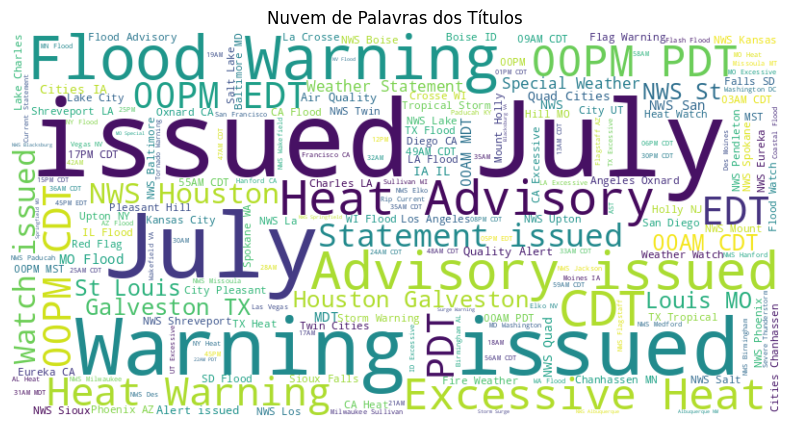

In [0]:
from wordcloud import WordCloud

text = ' '.join(pandas_df['title'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Nuvem de Palavras dos Títulos')

In [0]:
# DataFrame para contagem de tipos de mensagem
msg_type_counts = pandas_df['cap:msgType'].value_counts().reset_index()
msg_type_counts.columns = ['Tipo de Mensagem', 'Contagem']

# Gráfico de contagem para tipos de mensagem com Plotly
fig = px.bar(
    msg_type_counts,
    x='Tipo de Mensagem',
    y='Contagem',
    labels={'Tipo de Mensagem': 'Tipo de Mensagem', 'Contagem': 'Contagem'},
    title='Contagem de Tipos de Mensagem',
    color='Tipo de Mensagem',  # Definir cor diferente para cada barra
    color_discrete_sequence=px.colors.qualitative.Plotly  # Escolher uma paleta de cores
)

# Atualizar o layout do gráfico
fig.update_layout(
    xaxis_title='Tipo de Mensagem',
    yaxis_title='Contagem',
    xaxis={'categoryorder':'total descending'}
)

# Mostrar o gráfico
fig.show()

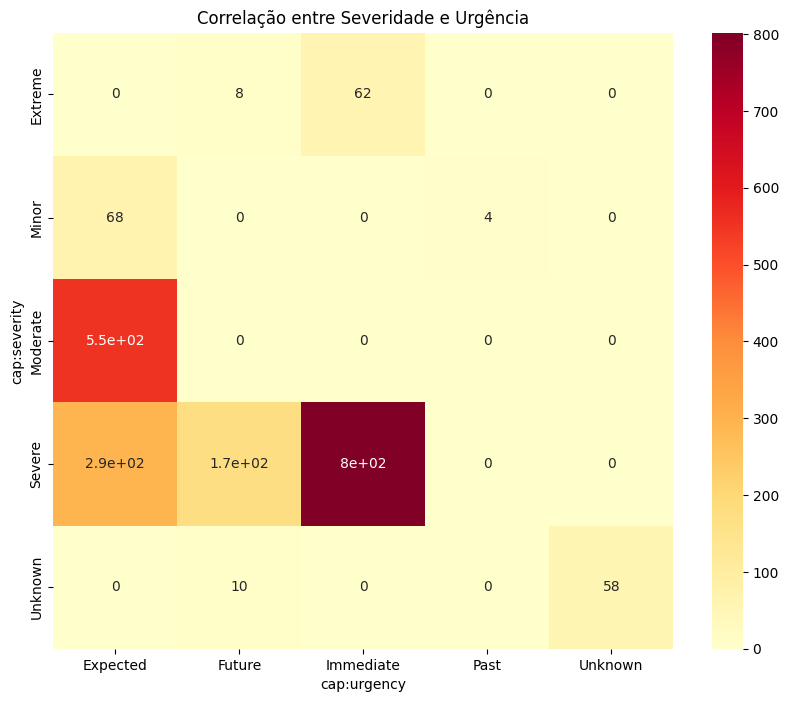

In [0]:
# Gráfico de calor para correlação entre severidade e urgência
severity_urgency = pd.crosstab(pandas_df['cap:severity'], pandas_df['cap:urgency'])
plt.figure(figsize=(10, 8))
sns.heatmap(severity_urgency, annot=True, cmap='YlOrRd')
plt.title('Correlação entre Severidade e Urgência')
plt.show()

## Códigos de mapas

In [0]:
def mapa_severidade():    
    # Mapeando severidade para valores numéricos
    severity_map = {'Minor': 0, 'Moderate': 1, 'Severe': 2, 'Extreme': 3}
    pandas_df['severity_value'] = pandas_df['cap:severity'].map(severity_map)

    scl = [
        [0, "rgb(150,0,90)"], [0.25, "rgb(0, 0, 200)"],
        [0.5, "rgb(0, 255, 0)"], [0.75, "rgb(255, 234, 0)"],
        [1, "rgb(255, 0, 0)"]
    ]

    fig = go.Figure(data=go.Scattergeo(
        lat = pandas_df['lat'],
        lon = pandas_df['lng'],
        text = pandas_df['cap:event'] + '<br>' + pandas_df['cap:severity'] + ' severity',
        marker = dict(
            color = pandas_df['severity_value'],
            colorscale = scl,
            reversescale = False,
            opacity = 0.7,
            size = 5,
            colorbar = dict(
                title = "Severity",
                titleside = "right",
                outlinecolor = "rgba(68, 68, 68, 0)",
                ticks = "outside",
                showticksuffix = "last",
                tickvals = [0, 1, 2, 3],
                ticktext = ['Minor', 'Moderate', 'Severe', 'Extreme']
            )
        )
    ))

    fig.update_layout(
        geo = dict(
            scope = 'usa',
            showland = True,
            landcolor = "rgb(212, 212, 212)",
            subunitcolor = "rgb(255, 255, 255)",
            countrycolor = "rgb(255, 255, 255)",
            showlakes = True,
            lakecolor = "rgb(255, 255, 255)",
            showsubunits = True,
            showcountries = True,
            resolution = 50,
            projection = dict(
                type = 'albers usa'
            ),
            lonaxis = dict(
                showgrid = True,
                gridwidth = 0.5,
                range= [ -140.0, -55.0 ],
                dtick = 5
            ),
            lataxis = dict (
                showgrid = True,
                gridwidth = 0.5,
                range= [ 20.0, 60.0 ],
                dtick = 5
            )
        ),
        title='Eventos por Severidade nos EUA<br>Fonte: Seu conjunto de dados',
    )

    # Adicionando seletor de categoria
    fig.update_layout(
        updatemenus=[
            dict(
                buttons=list([
                    dict(label="Todos",
                        method="update",
                        args=[{"visible": [True] * len(pandas_df)}]),
                ] + [
                    dict(label=category,
                        method="update",
                        args=[{"visible": pandas_df['cap:category'] == category}])
                    for category in pandas_df['cap:category'].unique()
                ]),
                direction="down",
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0.1,
                xanchor="left",
                y=1.1,
                yanchor="top"
            ),
        ]
    )

    fig.show()